# Neptune Data Reduction
In this program we have timeseries Neptune data and calibration frames which we will reduce to try and find its moons moving across the images.

<img src='Neptune_Data/final_science.png' width="2000">

In [1]:
import glob
import numpy as np
from astropy.io import fits
import astroalign as aa
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from tqdm import tqdm

plt.rcParams['font.family'] = 'Courier New'
import warnings
# suppress specific FutureWarning related to the `sep-pjw` package
warnings.filterwarnings("ignore", category=FutureWarning, message=".*sep-pjw.*")

In [2]:
def load_fits(file):
    '''
    loads fits data from a file and outputs the header and data
    Parameters
    ----------
    file_path: string
        filename including path to a fits file
    Returns
    -------
    data: np.ndarray[np.float64]
        NxM array of intensities
    '''
    with fits.open(file) as hdu:
        data = hdu[0].data.astype(np.float64)
        
    return data

def load_data_cube(path):
    '''
    searches for all data fits files in a directory and loads them into a numpy 3D data cube
    Parameters
    ----------
    path: string
        path to directory with fits files, will search for all files of specified extension
    Returns
    -------
    data_cube: np.ndarray[np.float64]
        ixMxN array where each i index corresponds to a different fits data file
        each data file is transposed into a MxN matrix
    Example
    -------
    search for all fits files starting with 'HST' with .fits extention
        path = 'Spectro-Module/raw/HST*.fits'
    '''
    # searches for all files within a directory
    fits_files = sorted(glob.glob(path))
    # allocate ixMxN data cube array
    i = len(fits_files)
    data = load_fits(fits_files[0])
    data_cube = np.zeros((i, data.shape[1], data.shape[0]))
    # save first file to data arrays
    data_cube[0,:,:] = data.T
    # loop through each array in data list and store in data cube
    for i in tqdm(range(1, len(fits_files))):
        data = load_fits(fits_files[i])
        data_cube[i,:,:] = data.T
        
    return data_cube

def imshow(image, raw=False, label=None, circles=False, savefig=False):
    '''
    Display fits file with plt.imshow
    Parameters
    ----------
    image: np.ndarray[np.float64]
        NxM fits file
    label: str
        figure title
    '''
    plt.figure(figsize=(14,7))
    if raw:
        plt.imshow(image, vmin=np.median(image)-25, vmax=np.median(image)+25, origin='lower',aspect='auto')
    else:
        plt.imshow(image, vmin=np.nanpercentile(image,3), vmax=np.nanpercentile(image, 97), origin='lower', aspect='auto')
    # add a title
    if label != None:
        plt.title(label, size=15)
    # adding circle markers
    if circles != False:
        colors = plt.get_cmap('spring')(np.linspace(.2, 1, len(circles)))
        X, Y, R = zip(*circles)
        for i, (x,y,r) in enumerate(zip(X,Y,R)):
            circle = Circle((x, y), radius=r, color=colors[i], fill=False, linewidth=2)
            plt.gca().add_patch(circle)
    if savefig != False:
        plt.savefig(savefig, dpi=300, format='png')
    plt.show()

## Loading data
we will use a numpy data cube to store the data with the format [N_image x x_pixels x y_pixels] where N_image is the number of images, and x_pixels and y_pixels represent each image dimension. This is useful as we can perform all data reduction steps using vectorized operations to avoid using for loops. We can then use the imshow function to plot a single frame of each cube.

In [3]:
# load data cubes
science_cube = load_data_cube('Neptune_Data/science/*')
darks_cube = load_data_cube('Neptune_Data/darks/*')
flats_cube = load_data_cube('Neptune_Data/flats/*')

100%|████████████████████████████████████████████| 4/4 [00:00<00:00, 247.23it/s]


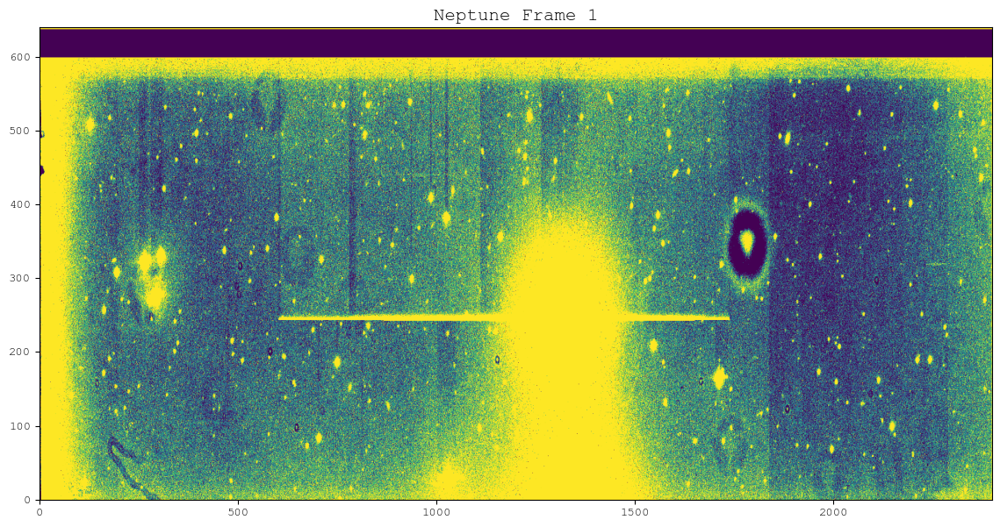

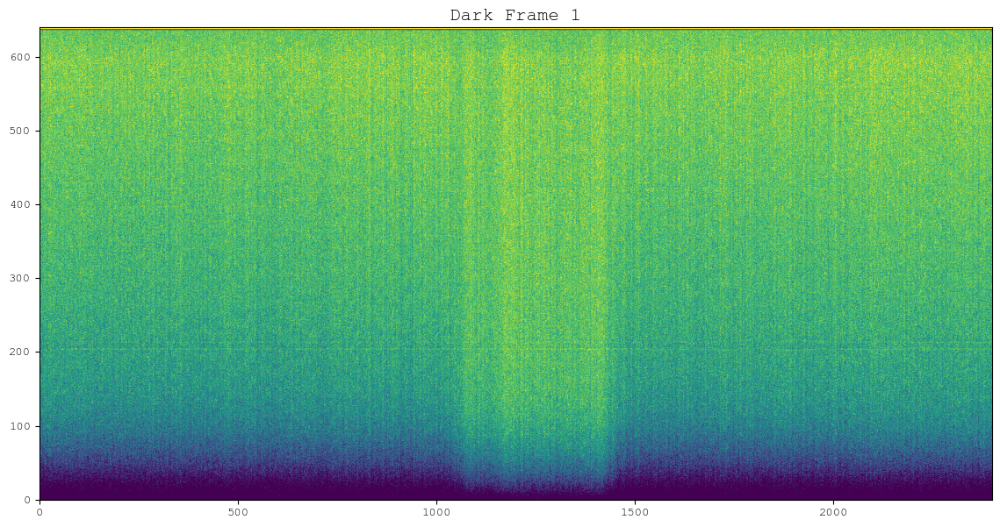

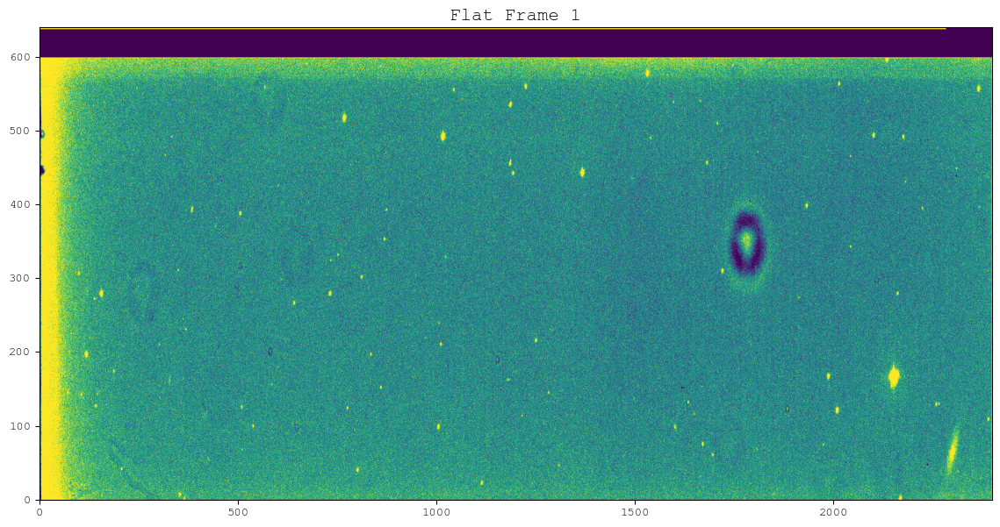

In [4]:
imshow(science_cube[0], raw=True, label='Neptune Frame 1')
imshow(darks_cube[0], label='Dark Frame 1')
imshow(flats_cube[0], raw=True, label='Flat Frame 1')

## Overscan subtraction
Every image has inherent instrumental noise that must be properly removed in order to make accurate measurements. Each frame has a bias overscan visible as the purple band stretching from y pixels 600-640. This region is not exposed to light and represents the sensitivity or 'zero-level' of the CCD and is important to account for this in our image. We subtract, from each image, the column-wise median of the overscan region (computed across rows), then crop out the overscan region.

In [5]:
def remove_overscan(image):
    '''
    Subtract bias median overscan value from a 
    data cube of images and crop out overscan
    Parameters
    ----------
    image: np.ndarray[np.float64]
        ixNxM fits data cube where i is the number
        of images and NxM is the image dimensions
    Returns
    -------
    image: np.ndarray[np.float64]
        bias subtracted ixAxM fits data cube where 
        A = N-overscan region
    '''
    # take the median of the overscan
    overscan = np.nanmedian(image[:,600:,:], axis=1)
    # subtract median overscan from imgage
    # crop out overscan region from image with slice
    image = image[:,:600,:] - overscan[:, np.newaxis, :]
    # Return the resulting image
    return image

science_cube = remove_overscan(science_cube)
darks_cube = remove_overscan(darks_cube)
flats_cube = remove_overscan(flats_cube)

## Flat calibration
To create the master flat after bias subtraction, we subtract the dark current, before normalizing each frame. Finally we median combine each frame into one master flat.
### Dark subtraction
The next level of noise in our image is the dark current which represents thermal noise from our detector. We have 2 dark frames, one for the flat frames (darks_cube[0]) and one for the science frames (darks_cube[1]) which we can subtract out directly. This also helps remove hot pixels from our science image.
### Median combining
We then stack the images using the median combining method which removes outliers and boosts the signal to noise ratio.

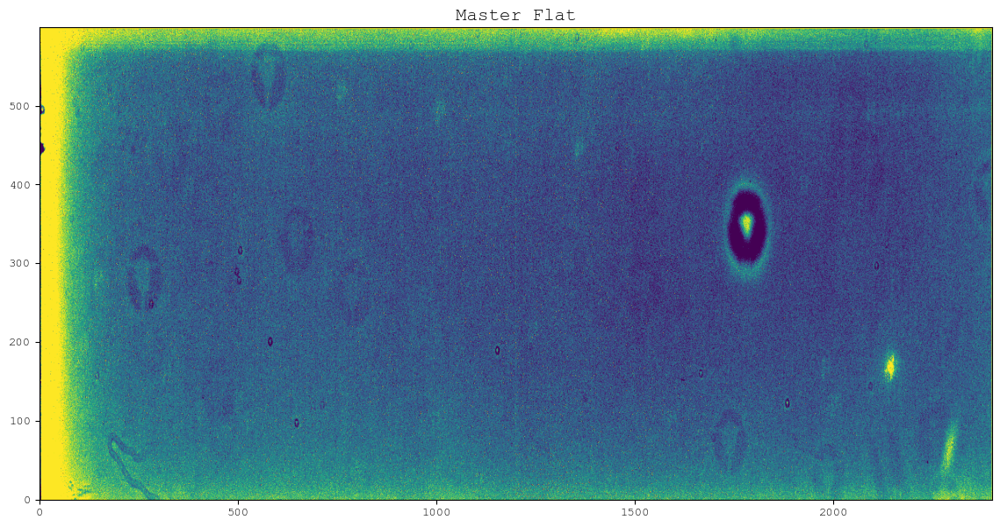

In [6]:
# dark subtract flats
flats_cube -= darks_cube[0]
# normalize flat
medians = np.nanmedian(flats_cube, axis=(1,2))
# the np.newaxis is to allow numpy broadcasting
# our data cube has shape ixNxM while medians shape i
# therefore we add two dummy axes
norm_flats = flats_cube / medians[:, np.newaxis, np.newaxis]
# median combine flats
master_flat = np.nanmedian(norm_flats, axis=0)
imshow(master_flat, label='Master Flat')

## Science frames reduction
To properly 'flat field' our science frames, we can apply our master flat frame to each science frame. science frames are reduced using the equation:

$
    \text{Reduced Science Image} = \frac{\text{Raw Science - Dark}}{\text{Flat}}
$

In [7]:
norm_science = (science_cube - darks_cube[1]) / master_flat

## Sky subtraction
Finally we can subtract the average sky value from each of our images. We take a histogram of each image and subtract the peak value from each science frame.

In [8]:
def subtract_sky_values(science_cube, N_bins=3000):
    '''
    Subtract the sky value from a science image data cube
    Parameters
    ----------
    science_cube: np.ndarray[np.float64]
        ixNxM fits data cube where i is the number
        of images and NxM is the image dimensions
    N_bins: int
        number of bins to sample data, by default is 3000
    Returns
    -------
    reduced_science: np.ndarray[np.float64]
        ixNxM fits data cube where each image
        is sky subtracted
    '''
    # determine range of bins from data
    min_val = np.nanmin(science_cube)
    max_val = np.nanmax(science_cube)
    bins = np.linspace(min_val, max_val, N_bins)

    # compute number of images
    N = science_cube.shape[0]
    
    # compute the histogram of each image
    histograms = [np.histogram(science_cube[i, :, :].flatten(), bins=bins) 
                  for i in range(science_cube.shape[0])]
    # unpack the counts and edges of each image histogram
    counts, edges = zip(*histograms)
    # convert to arrays and compute the centers of each set of bins
    counts, edges = np.array(counts), np.array(edges)
    centers = (edges[:,1:] + edges[:,:-1])/2
    # find index of each image's histogram peak
    peak_loc = np.argmax(counts, axis=1)
    # sky values are the values of the bins associated with each peak
    sky_value = centers[np.arange(N), peak_loc]

    # subtract sky value from each science image
    reduced_science = science_cube - sky_value[:, np.newaxis, np.newaxis]

    # plot histogram
    colors = plt.get_cmap('rainbow')(np.linspace(0.1, 1, len(counts)))
    plt.figure(figsize=(10,4))
    plt.rcParams['axes.linewidth'] = 0.5
    plt.minorticks_on()
    plt.tick_params(axis = 'both', length = 3, direction = 'in', 
                    which = 'both', right = True, top = True)
    for i in range(len(counts)):
        plt.step(centers[i], counts[i], c=colors[i], label=f'image {i}, sky val: {sky_value[i]:.0}')
    
    plt.xscale('log')
    plt.xlabel('Bin Centers [log]', size=16)
    plt.ylabel('Counts', size=16)
    plt.legend()
    plt.show()

    return reduced_science

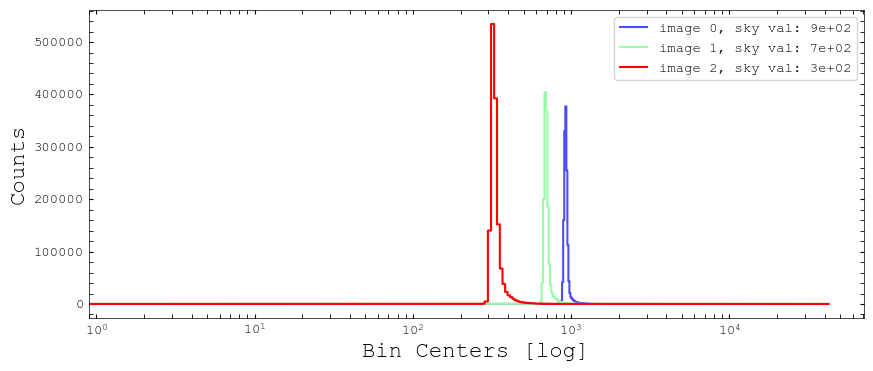

In [9]:
reduced_science = subtract_sky_values(norm_science)

## Image registration
Each image has a tiny amount of drift with respect to each other due to Earth's rotation and tracking errors. We can use astroalign to register or align each image with respect to a refrence image. This applies a set of transformations such that the stars are aligned in each image. Here we choose the first image as the reference image. We can then blink the image to search for Neptune's moons which would appear to move with respect to the background stars. We can also median combine the science images to increase the signal to noise ratio.

In [11]:
# copy data into a new array
registered_cube = reduced_science.copy()
# choose reference image
reference_image = reduced_science[0]
# register each image
for i in range(1, reduced_science.shape[0]):
    registered_cube[i,:,:], _ = aa.register(reduced_science[i], reference_image)
# median combine the science images into a final science frame
stacked_science = np.median(registered_cube, axis=0)

## Final science frame
Here is the fully reduced, stacked science frame! Notice how all the noise and dust donuts have been removed and we are left with a clean science image!

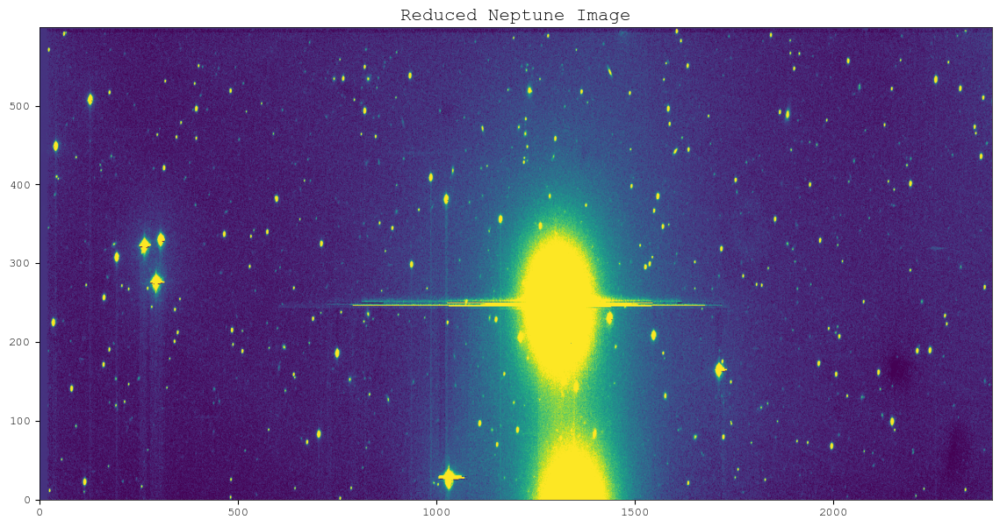

In [12]:
imshow(stacked_science, label='Reduced Neptune Image')

## Searching for the moons
Here i was able to find 3 of Neptunes moons! Each one is circled and you can see the subtle motion from frame to frame. Maybe you can find more!

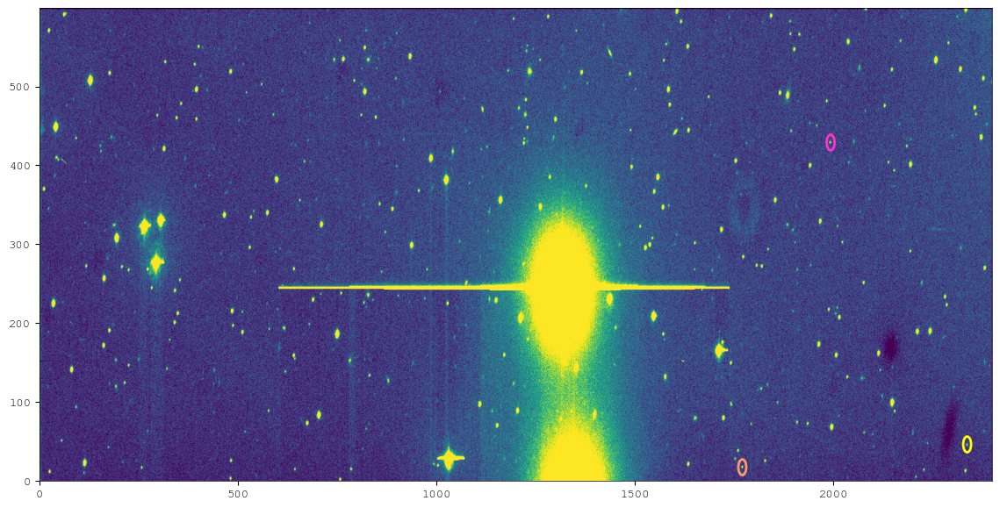

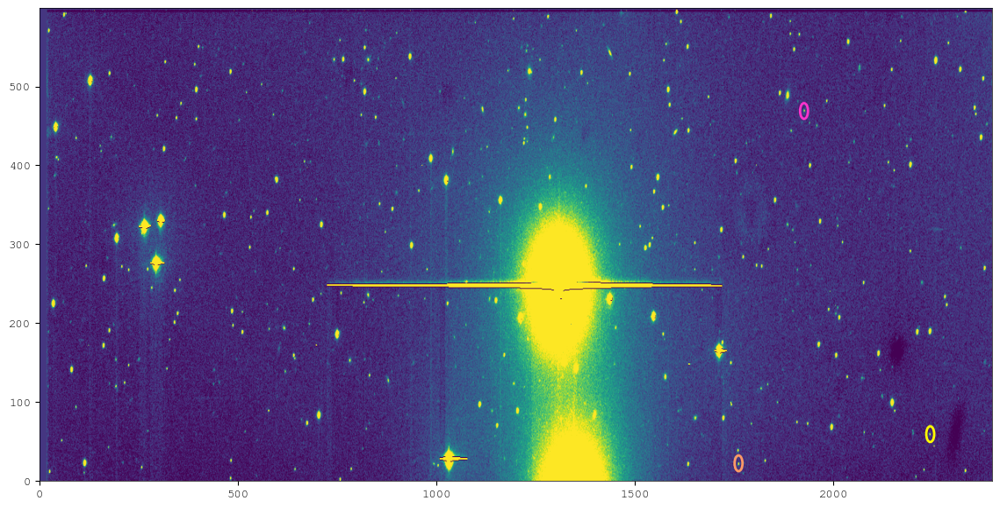

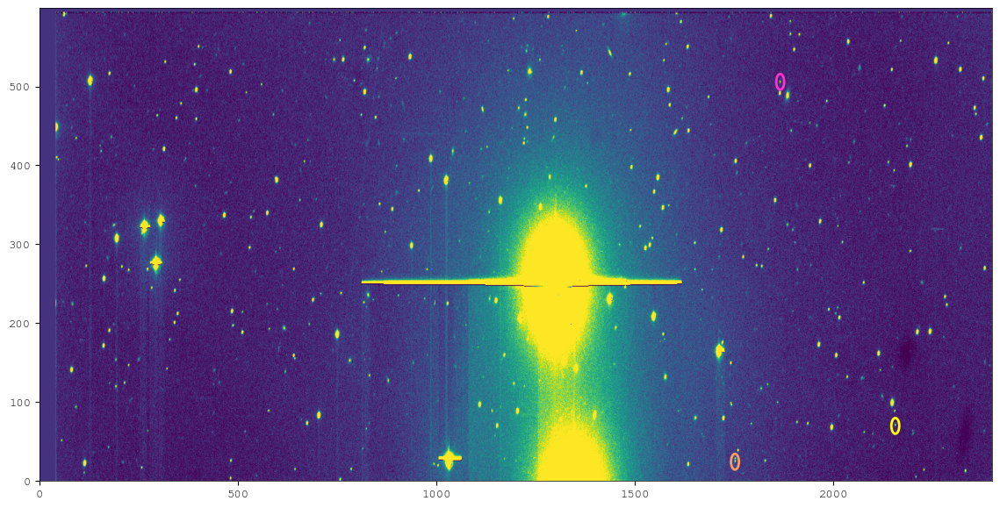

In [13]:
moon_1 = [ [1993,429,10], [1926,469,10], [1866,506,10] ]
moon_2 = [ [1770.5,17,10], [1761,22,10], [1752,24,10] ]
moon_3 = [ [2337,46,10], [2244,59,10], [2156,69.5,10] ]
for i in range(registered_cube.shape[0]):
    imshow(registered_cube[i], circles=[ moon_1[i], moon_2[i], moon_3[i] ])

## Aniamting the motion
With IPython installed, we can play a gif I created to clearly see the motion of the moons, with and without the markers. You can also see the gifs in the Neptune_Data folder in the github repo.

In [14]:
from IPython.display import HTML

In [15]:
HTML('<img src="Neptune_Data/ezgif-518795593d087b.gif" width="3000">')

In [16]:
HTML('<img src="Neptune_Data/ezgif-54094f96881488.gif" width="3000">')